# Top 12 German Companies

Cargamos los datos

In [107]:
import pandas as pd
ds_path = "../datasets/dataset-4/Top_12_German_Companies NEW.csv"
df = pd.read_csv(ds_path)


In [108]:
df.head(10)

,Company,Period,Revenue,Net Income,Liabilities,Assets,Equity,ROA (%),ROE (%),Debt to Equity,percentage Debt to Equity
0,Volkswagen AG,12/31/2017,9750496618,5.168898e+08,21354201295,54861302788,33507101493,942.175.618,1.542.627.668,637.303.746,"0,00%"
1,Siemens AG,12/31/2017,19716237464,1.276840e+09,45009303223,75268101508,30258798286,1.696.389.282,4.219.731.382,1.487.478.214,"283,68%"
2,Allianz SE,12/31/2017,19458831198,1.600107e+09,48538978480,69583711255,21044732775,2.299.542.624,7.603.361.452,2.306.466.848,"329,65%"
3,BMW AG,12/31/2017,18808147150,9.601843e+08,35382107627,67327482638,31945375011,142.614.028,3.005.706.927,1.107.581.539,"0,00%"
4,BASF SE,12/31/2017,16895580815,1.797082e+09,28309420014,68036567115,39727147101,2.641.347.127,4.523.561.449,71.259.635,"634,80%"
5,Deutsche Telekom AG,12/31/2017,11505351408,1.425682e+09,36680109736,61941763399,25261653663,2.301.649.081,5.643.660.732,1.452.007.467,"388,68%"
6,Daimler AG,12/31/2017,17133317238,1.743085e+09,19707492188,56381587968,36674095780,309.158.516,4.752.904.659,537.368.182,"884,48%"
7,SAP SE,12/31/2017,17560385805,2.276361e+09,40828269592,73785136305,32956866713,3.085.121.245,6.907.091.429,123.883.954,"557,55%"
8,Bayer AG,12/31/2017,18251254610,2.670536e+09,16524775630,29169852309,12645076680,915.512.207,2.111.917.274,130.681.498,"1616,08%"
9,Deutsche Bank AG,12/31/2017,9318303083,9.585083e+08,11123712659,49692010679,38568298020,1.928.898.269,2.485.223.313,288.415.959,"0,00%"


Exploramos los datos

In [109]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384 entries, 0 to 383
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Company                     384 non-null    object 
 1   Period                      384 non-null    object 
 2   Revenue                     384 non-null    int64  
 3   Net Income                  384 non-null    float64
 4   Liabilities                 384 non-null    int64  
 5   Assets                      384 non-null    int64  
 6   Equity                      384 non-null    int64  
 7   ROA (%)                     384 non-null    object 
 8   ROE (%)                     384 non-null    object 
 9   Debt to Equity              384 non-null    object 
 10  percentage  Debt to Equity  384 non-null    object 
dtypes: float64(1), int64(4), object(6)
memory usage: 33.1+ KB


Se observan tipos de datos que pueden ser ajustados

Observamos los valores unicos de las variables categóricas

In [110]:
def isfloat(num): #esta función verifica si el valoor ingresado es de tipo float
    try:
        float(num)
        return True
    except ValueError:
        return False
cantidad = 0
finvalido = []
for i in range(len(df)):
    if (not isfloat(df.iloc[i,7])): # se verifica si es float y en caso de no serlo, se visualiza para evaluar cómo repararlo
        print("El valor de la fila ", i ," columna es [", df.iloc[i,7], "]")
        cantidad += 1
        finvalido.append(i)
print("Se encontraron ", cantidad, "valores inválidos en las filas ,", finvalido)

El valor de la fila  0  columna es [ 942.175.618 ]
El valor de la fila  1  columna es [ 1.696.389.282 ]
El valor de la fila  2  columna es [ 2.299.542.624 ]
El valor de la fila  3  columna es [ 142.614.028 ]
El valor de la fila  4  columna es [ 2.641.347.127 ]
El valor de la fila  5  columna es [ 2.301.649.081 ]
El valor de la fila  6  columna es [ 309.158.516 ]
El valor de la fila  7  columna es [ 3.085.121.245 ]
El valor de la fila  8  columna es [ 915.512.207 ]
El valor de la fila  9  columna es [ 1.928.898.269 ]
El valor de la fila  10  columna es [ 120.971.386 ]
El valor de la fila  11  columna es [ 1.567.359.526 ]
El valor de la fila  12  columna es [ 2.464.119.008 ]
El valor de la fila  13  columna es [ 1.301.939.971 ]
El valor de la fila  14  columna es [ 229.287.642 ]
El valor de la fila  15  columna es [ 1.022.303.562 ]
El valor de la fila  16  columna es [ 124.252.735 ]
El valor de la fila  17  columna es [ 3.001.727.892 ]
El valor de la fila  18  columna es [ 2.853.763.473 

In [ ]:
df['ROA (%)'] = (df['Net Income'] / df['Assets']) * 100
df['ROE (%)'] = (df['Net Income'] / df['Equity']) * 100
# Convert to numeric type if needed
df['Debt to Equity'] = df['Debt to Equity'].str.replace('.', '', regex=False)
df['Debt to Equity'] = pd.to_numeric(df['Debt to Equity'], errors='coerce')

df['percentage  Debt to Equity'] = df['percentage  Debt to Equity'].str.replace(',', '', regex=False).str.replace('%', '', regex=False)
df['percentage  Debt to Equity'] = pd.to_numeric(df['percentage  Debt to Equity'], errors='coerce')
df['percentage  Debt to Equity'] = (df['percentage  Debt to Equity'] / 100)

In [112]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384 entries, 0 to 383
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Company                     384 non-null    object 
 1   Period                      384 non-null    object 
 2   Revenue                     384 non-null    int64  
 3   Net Income                  384 non-null    float64
 4   Liabilities                 384 non-null    int64  
 5   Assets                      384 non-null    int64  
 6   Equity                      384 non-null    int64  
 7   ROA (%)                     384 non-null    float64
 8   ROE (%)                     384 non-null    float64
 9   Debt to Equity              384 non-null    int64  
 10  percentage  Debt to Equity  384 non-null    float64
dtypes: float64(4), int64(5), object(2)
memory usage: 33.1+ KB


In [113]:
df.head(10)

,Company,Period,Revenue,Net Income,Liabilities,Assets,Equity,ROA (%),ROE (%),Debt to Equity,percentage Debt to Equity
0,Volkswagen AG,12/31/2017,9750496618,5.168898e+08,21354201295,54861302788,33507101493,0.942176,1.542628,637303746,0.00
1,Siemens AG,12/31/2017,19716237464,1.276840e+09,45009303223,75268101508,30258798286,1.696389,4.219731,1487478214,283.68
2,Allianz SE,12/31/2017,19458831198,1.600107e+09,48538978480,69583711255,21044732775,2.299543,7.603361,2306466848,329.65
3,BMW AG,12/31/2017,18808147150,9.601843e+08,35382107627,67327482638,31945375011,1.426140,3.005707,1107581539,0.00
4,BASF SE,12/31/2017,16895580815,1.797082e+09,28309420014,68036567115,39727147101,2.641347,4.523561,71259635,634.80
5,Deutsche Telekom AG,12/31/2017,11505351408,1.425682e+09,36680109736,61941763399,25261653663,2.301649,5.643661,1452007467,388.68
6,Daimler AG,12/31/2017,17133317238,1.743085e+09,19707492188,56381587968,36674095780,3.091585,4.752905,537368182,884.48
7,SAP SE,12/31/2017,17560385805,2.276361e+09,40828269592,73785136305,32956866713,3.085121,6.907091,123883954,557.55
8,Bayer AG,12/31/2017,18251254610,2.670536e+09,16524775630,29169852309,12645076680,9.155122,21.119173,130681498,1616.08
9,Deutsche Bank AG,12/31/2017,9318303083,9.585083e+08,11123712659,49692010679,38568298020,1.928898,2.485223,288415959,0.00


In [114]:
from utils.extra import convert_bolean_columns
convert_bolean_columns(df)
df["Company"] = df["Company"].astype("category")
df["Period"] = pd.to_datetime(df["Period"], format="%m/%d/%Y")
df["ROA (%)"] = df["ROA (%)"].astype("float")
df["ROE (%)"] = df["ROE (%)"].astype("float")
df["Debt to Equity"] = df["Debt to Equity"].astype("float")

In [115]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384 entries, 0 to 383
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Company                     384 non-null    category      
 1   Period                      384 non-null    datetime64[ns]
 2   Revenue                     384 non-null    int64         
 3   Net Income                  384 non-null    float64       
 4   Liabilities                 384 non-null    int64         
 5   Assets                      384 non-null    int64         
 6   Equity                      384 non-null    int64         
 7   ROA (%)                     384 non-null    float64       
 8   ROE (%)                     384 non-null    float64       
 9   Debt to Equity              384 non-null    float64       
 10  percentage  Debt to Equity  384 non-null    float64       
dtypes: category(1), datetime64[ns](1), float64(5), int64(4)
me

Continuamos con la exploración de los datos

Visualizamos la cabecera, luego las últimas entradas

In [116]:
df.tail(10)

,Company,Period,Revenue,Net Income,Liabilities,Assets,Equity,ROA (%),ROE (%),Debt to Equity,percentage Debt to Equity
374,Allianz SE,2024-09-30,16908879786,1.197174e+09,48008203569,67570965703,19562762134,1.771728,6.119657,2.454061e+09,249.37
375,BMW AG,2024-09-30,17989542164,2.639442e+09,33643521649,69399402463,35755880815,3.803263,7.381840,9.409227e+08,784.53
376,BASF SE,2024-09-30,16485330446,1.727331e+09,41199120058,58775396940,17576276882,2.938867,9.827625,2.344019e+09,419.26
377,Deutsche Telekom AG,2024-09-30,6531276814,8.727675e+08,15526905086,49404344791,33877439705,1.766581,2.576250,4.583258e+08,0.00
378,Daimler AG,2024-09-30,14640665936,2.101928e+09,10787737144,51913035226,41125298082,4.048940,5.111034,2.623139e+08,1948.44
379,SAP SE,2024-09-30,10824151396,8.302800e+08,42369695133,72342104340,29972409208,1.147713,2.770148,1.413623e+09,0.00
380,Bayer AG,2024-09-30,9332023907,7.466675e+08,23673143006,42677324477,19004181470,1.749565,3.928965,1.245681e+09,0.00
381,Deutsche Bank AG,2024-09-30,18549946525,2.323022e+09,49199711543,64461554635,15261843092,3.603733,15.221112,3.223707e+09,472.16
382,Porsche AG,2024-09-30,15911174550,1.241694e+09,36125130235,84583217359,48458087124,1.468014,2.562408,7.454923e+08,343.72
383,Merck KGaA,2024-09-30,15036344926,1.704098e+09,30603212259,59444780752,28841568494,2.866690,5.908478,1.061080e+09,556.84


Verificamos los valores descriptivos

In [117]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
Period,384,2021-02-13 12:00:00,2017-03-31 00:00:00,2019-03-08 12:00:00,2021-02-14 00:00:00,2023-01-22 12:00:00,2024-12-31 00:00:00,NaN
Revenue,384.0,12709920012.414062,5149849693.0,9315160969.25,12669631607.5,16217235280.5,19909637251.0,4095183011.508822
Net Income,384.0,1249025113.673698,298030924.1,864381347.1,1145475814.5,1560234392.0,2884007106.0,544544128.563978
Liabilities,384.0,31155787345.859375,10046371516.0,20851735943.75,32306589588.0,40889421725.0,49769403556.0,11395383744.976673
Assets,384.0,61416239682.148438,21773242219.0,50740129341.5,60207151100.5,73690748235.75,96574017987.0,16989219905.667027
Equity,384.0,30260452336.309895,10017618918.0,19668125650.25,29990626859.0,39846459661.5,49918115168.0,11728030365.485052
ROA (%),384.0,2.260345,0.501102,1.310458,1.902219,2.850194,9.156052,1.406047
ROE (%),384.0,4.992758,0.98048,2.596827,4.004204,6.273825,21.119173,3.40137
Debt to Equity,384.0,1085740030.770833,7718738.0,518595985.5,944021966.5,1405983685.5,4631348222.0,828704104.782193
percentage Debt to Equity,384.0,406.893177,0.0,0.0,325.505,551.4925,2617.56,458.921418


In [118]:
df.describe(include='category').T

,count,unique,top,freq
Company,384,12,Allianz SE,32


## Identificación de valores nulos y outliers

In [119]:
duplicated = df.duplicated().sum()
print(f"Registros duplicados en df: {duplicated}")

Registros duplicados en df: 0


no observamos duplicados

Ahora valores nulos

In [120]:
from utils.extra import get_nulll_data_info
get_nulll_data_info(df)

,datos sin NAs en q,Na en q,Na en %
Company,384,0,0.0
Period,384,0,0.0
Revenue,384,0,0.0
Net Income,384,0,0.0
Liabilities,384,0,0.0
Assets,384,0,0.0
Equity,384,0,0.0
ROA (%),384,0,0.0
ROE (%),384,0,0.0
Debt to Equity,384,0,0.0


No se visualizan valores nulos

Ahora verificamos los outliers

In [121]:
from utils.extra import get_outliers_data
get_outliers_data(df)

,Revenue,Net Income,Liabilities,Assets,Equity,ROA (%),ROE (%),Debt to Equity,percentage Debt to Equity
N° Outliers,0.000000e+00,9.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,15.000000,23.000000,2.100000e+01,20.000000
% Outliers,0.000000e+00,2.343750e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.906250,5.989583,5.468750e+00,5.208333
Lim. mix,-1.037950e+09,-1.793982e+08,-9.204793e+09,1.631420e+10,-1.059938e+10,-0.999146,-2.918669,-8.124856e+08,-827.238750
Lim. max,2.657035e+10,2.604014e+09,7.094595e+10,1.081167e+11,7.011396e+10,5.159798,11.789321,2.737065e+09,1378.731250


Visualizamos las gráficas de cajas de nuestras columnas

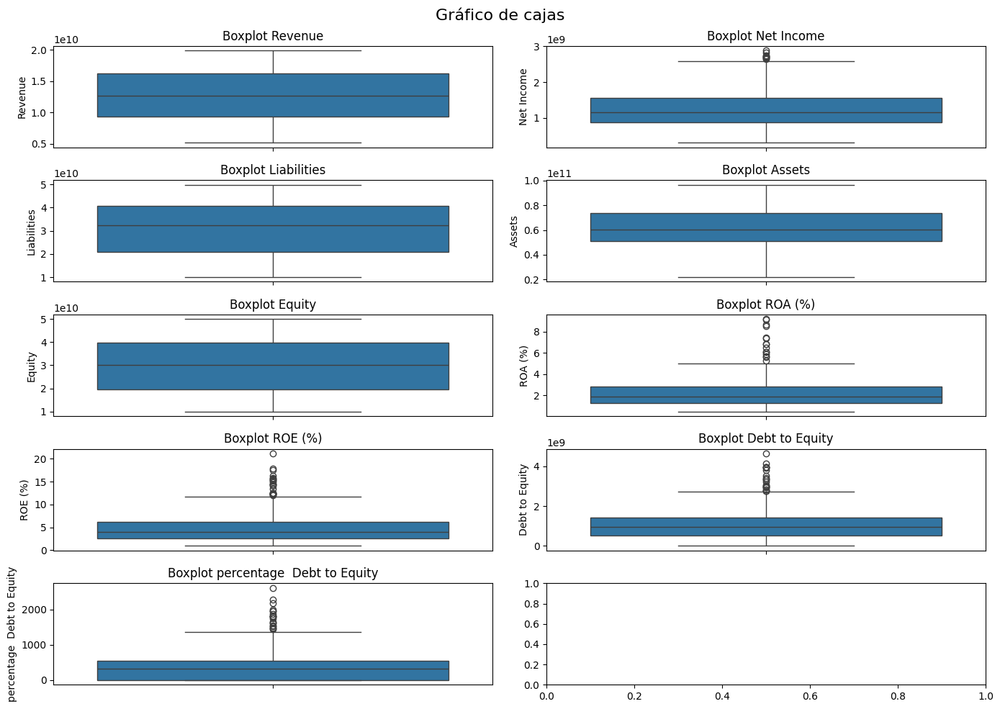

In [122]:
from utils.extra import graph_boxplot, get_numeric_columns
graph_boxplot(df, columns=get_numeric_columns(df), num_columns=2)

Observamos outliers en varias columnas

Ahora veremos las caracteristicas descriptivas de las variables númericas

In [123]:
df.describe()

,Period,Revenue,Net Income,Liabilities,Assets,Equity,ROA (%),ROE (%),Debt to Equity,percentage Debt to Equity
count,384,3.840000e+02,3.840000e+02,3.840000e+02,3.840000e+02,3.840000e+02,384.000000,384.000000,3.840000e+02,384.000000
mean,2021-02-13 12:00:00,1.270992e+10,1.249025e+09,3.115579e+10,6.141624e+10,3.026045e+10,2.260345,4.992758,1.085740e+09,406.893177
min,2017-03-31 00:00:00,5.149850e+09,2.980309e+08,1.004637e+10,2.177324e+10,1.001762e+10,0.501102,0.980480,7.718738e+06,0.000000
25%,2019-03-08 12:00:00,9.315161e+09,8.643813e+08,2.085174e+10,5.074013e+10,1.966813e+10,1.310458,2.596827,5.185960e+08,0.000000
50%,2021-02-14 00:00:00,1.266963e+10,1.145476e+09,3.230659e+10,6.020715e+10,2.999063e+10,1.902219,4.004204,9.440220e+08,325.505000
75%,2023-01-22 12:00:00,1.621724e+10,1.560234e+09,4.088942e+10,7.369075e+10,3.984646e+10,2.850194,6.273825,1.405984e+09,551.492500
max,2024-12-31 00:00:00,1.990964e+10,2.884007e+09,4.976940e+10,9.657402e+10,4.991812e+10,9.156052,21.119173,4.631348e+09,2617.560000
std,NaN,4.095183e+09,5.445441e+08,1.139538e+10,1.698922e+10,1.172803e+10,1.406047,3.401370,8.287041e+08,458.921418


In [124]:
from utils.extra import get_descriptive_statistics
get_descriptive_statistics(df)

,Revenue,Net Income,Liabilities,Assets,Equity,ROA (%),ROE (%),Debt to Equity,percentage Debt to Equity
min,5.149850e+09,2.980309e+08,1.004637e+10,2.177324e+10,1.001762e+10,0.501102,0.980480,7.718738e+06,0.000000
max,1.990964e+10,2.884007e+09,4.976940e+10,9.657402e+10,4.991812e+10,9.156052,21.119173,4.631348e+09,2617.560000
mean,1.270992e+10,1.249025e+09,3.115579e+10,6.141624e+10,3.026045e+10,2.260345,4.992758,1.085740e+09,406.893177
std,4.095183e+09,5.445441e+08,1.139538e+10,1.698922e+10,1.172803e+10,1.406047,3.401370,8.287041e+08,458.921418
median,1.266963e+10,1.145476e+09,3.230659e+10,6.020715e+10,2.999063e+10,1.902219,4.004204,9.440220e+08,325.505000
variation_coefficient,3.222037e-01,4.359753e-01,3.657550e-01,2.766242e-01,3.875696e-01,0.622050,0.681261,7.632620e-01,1.127867


Ahora visualizaremos los histogramas de las diferentes columnas numéricas para entender mejor la distribución

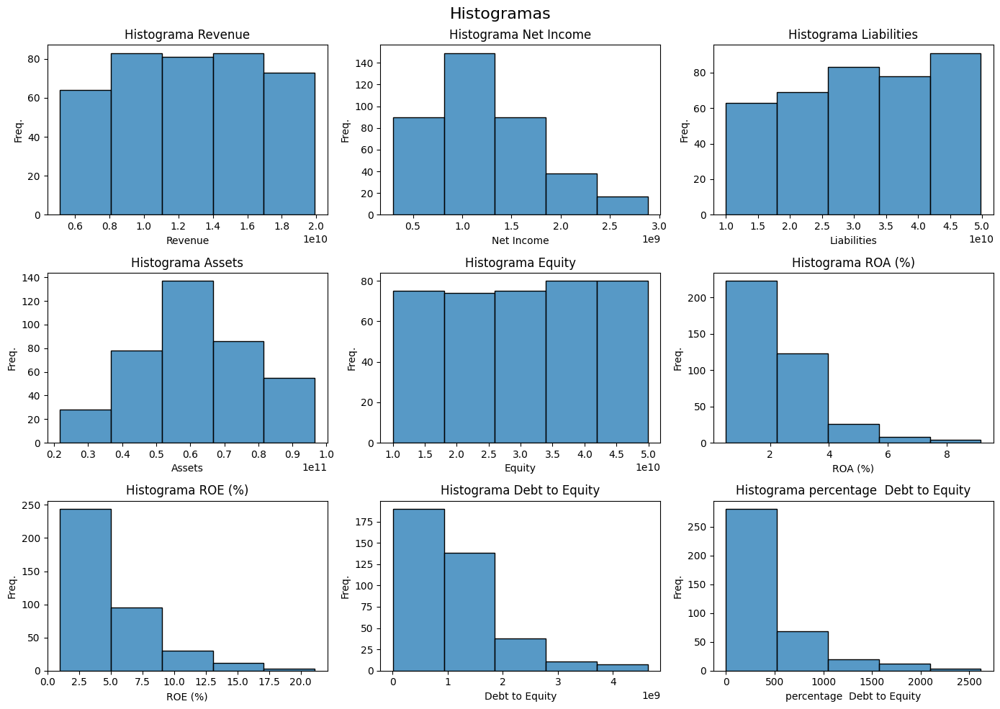

In [125]:
from utils.extra import graph_histogram
graph_histogram(df, get_numeric_columns(df))

No se observa nada fuera de lo normal en las distribuciones

Veremos las correlaciones entre las caracteristicas

In [126]:
from utils.extra import get_numeric_columns
numeric_columns = get_numeric_columns(df)
corr_matrix = df[numeric_columns].corr(method="pearson")
spearmann = df[numeric_columns].corr(method="spearman")
kendall = df[numeric_columns].corr(method="kendall")
corr_matrix

,Revenue,Net Income,Liabilities,Assets,Equity,ROA (%),ROE (%),Debt to Equity,percentage Debt to Equity
Revenue,1.000000,0.718924,-0.064508,-0.027382,0.023013,0.540507,0.453833,-0.048751,0.565286
Net Income,0.718924,1.000000,-0.159791,-0.126075,-0.027374,0.799678,0.647295,-0.085837,0.786912
Liabilities,-0.064508,-0.159791,1.000000,0.725577,0.079435,-0.487408,-0.120569,0.424469,-0.507783
Assets,-0.027382,-0.126075,0.725577,1.000000,0.743602,-0.584224,-0.535110,-0.120249,-0.376855
Equity,0.023013,-0.027374,0.079435,0.743602,1.000000,-0.372723,-0.658011,-0.586622,-0.052531
ROA (%),0.540507,0.799678,-0.487408,-0.584224,-0.372723,1.000000,0.814557,-0.061765,0.850906
ROE (%),0.453833,0.647295,-0.120569,-0.535110,-0.658011,0.814557,1.000000,0.394021,0.523842
Debt to Equity,-0.048751,-0.085837,0.424469,-0.120249,-0.586622,-0.061765,0.394021,1.000000,-0.234151
percentage Debt to Equity,0.565286,0.786912,-0.507783,-0.376855,-0.052531,0.850906,0.523842,-0.234151,1.000000


Ahora graficamos el mapa de calor de las correlaciones

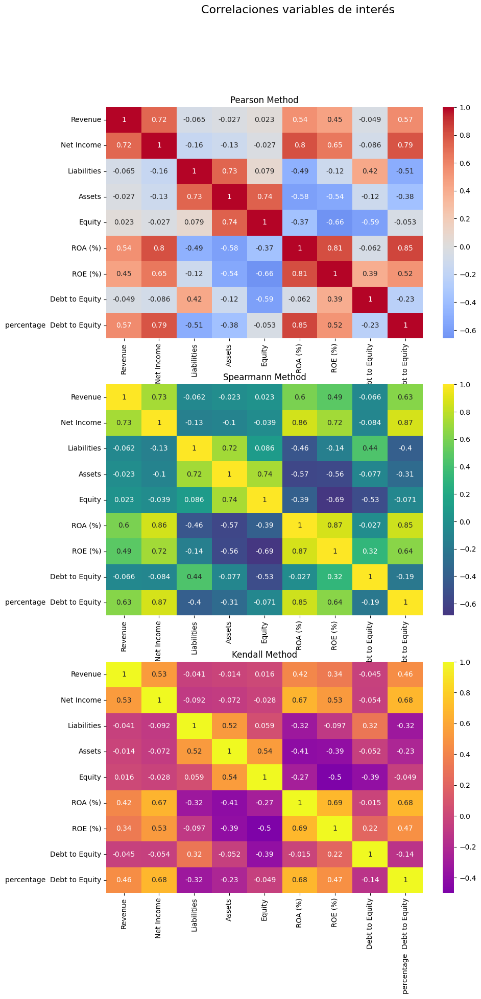

In [127]:
from utils.extra import graph_correlations
graph_correlations(corr_matrix, spearmann, kendall, "Correlaciones variables de interés", figsize= (10,20))

Se observan varias correlaciones
Las columnas de interés son percentage debt to equity, debt income, ROA, Revenue

Ahora observaremos la dispersión entre las variables

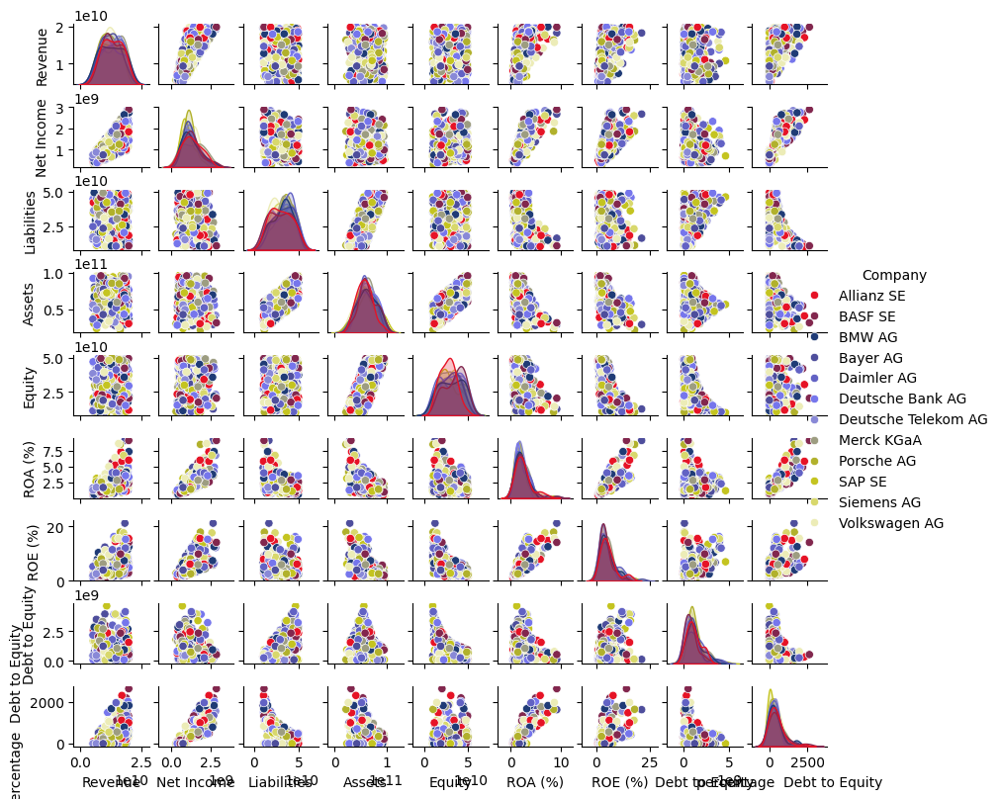

In [130]:
import matplotlib.pyplot as plt
import seaborn as sns
numeric_columns = get_numeric_columns(df)
palette = sns.color_palette("gist_stern", n_colors=12)
g = sns.pairplot(df[[*numeric_columns] + ["Company"]], hue='Company', height=1.2, diag_kind = 'kde', palette=palette)
g.figure.set_size_inches(10, 8)
plt.show()

No se observa ningún patrón a simple vista.
Solamente el problema de las entradas erroneas de impuestos

Ahora las observamos con más detalles

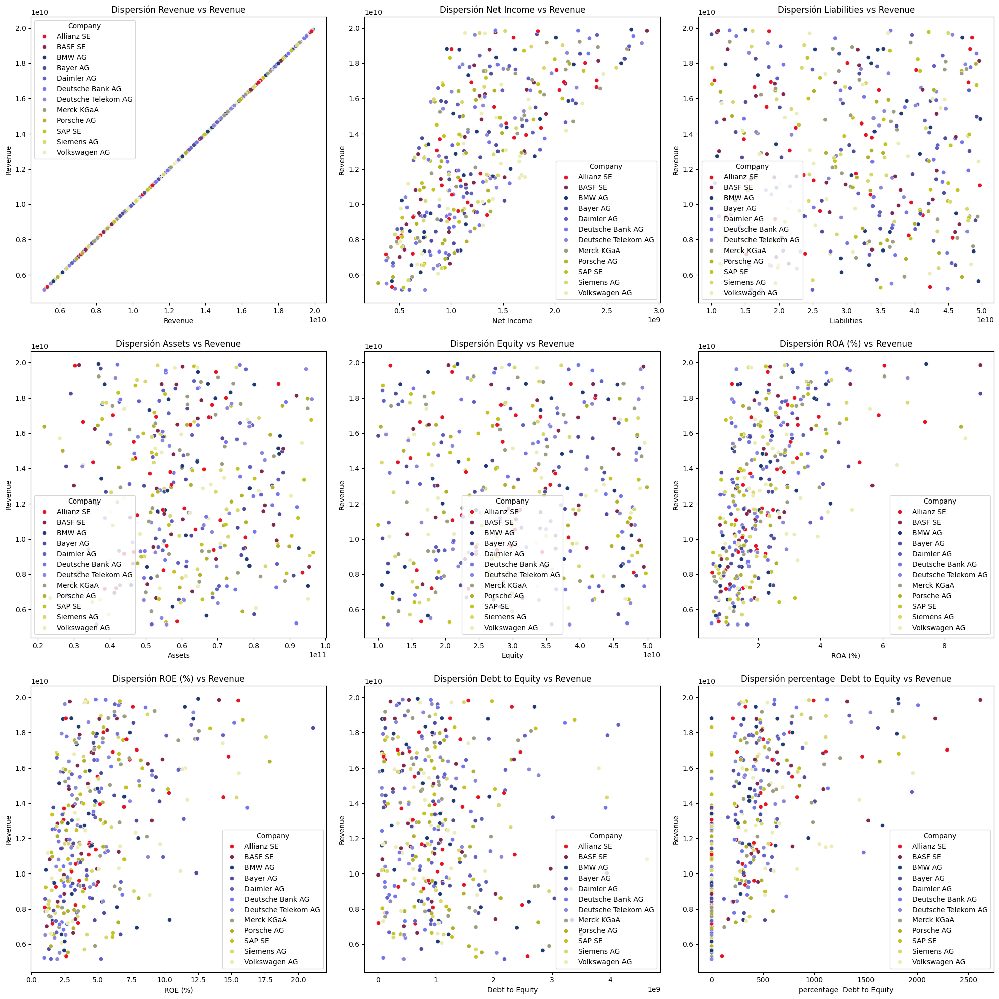

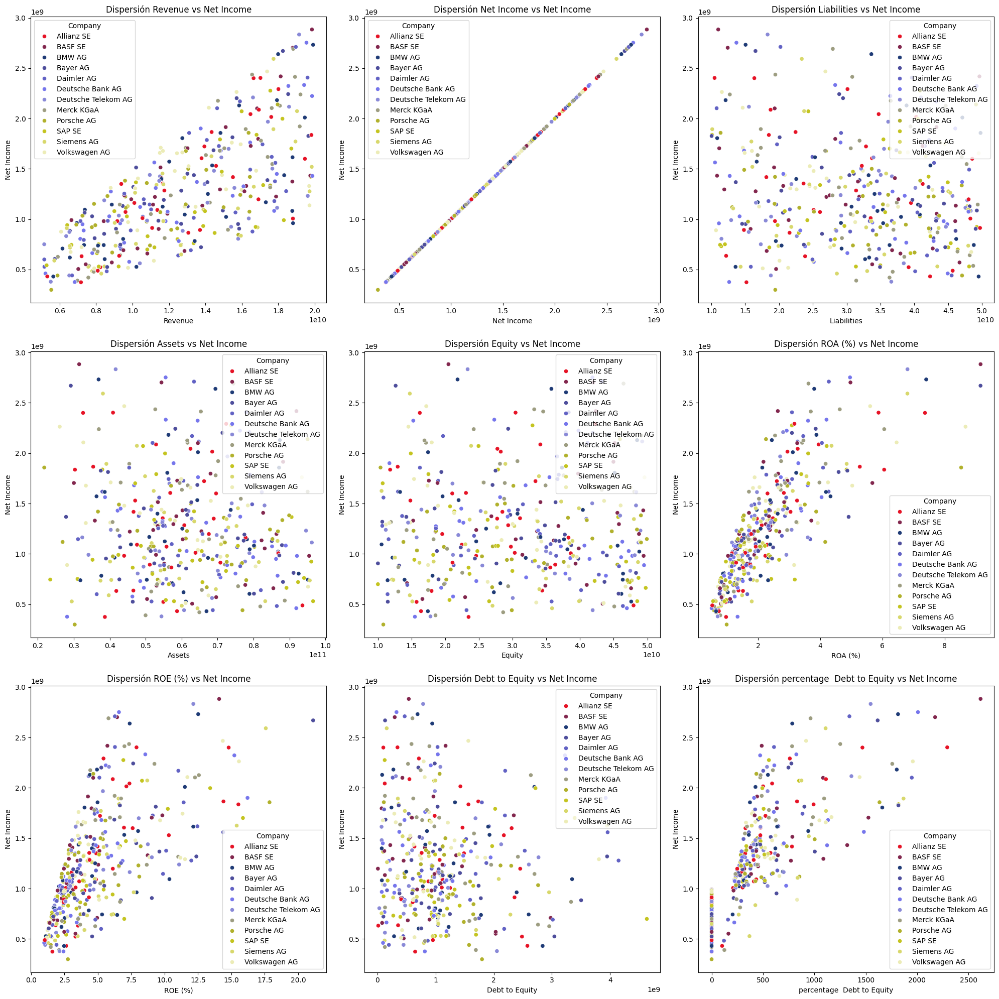

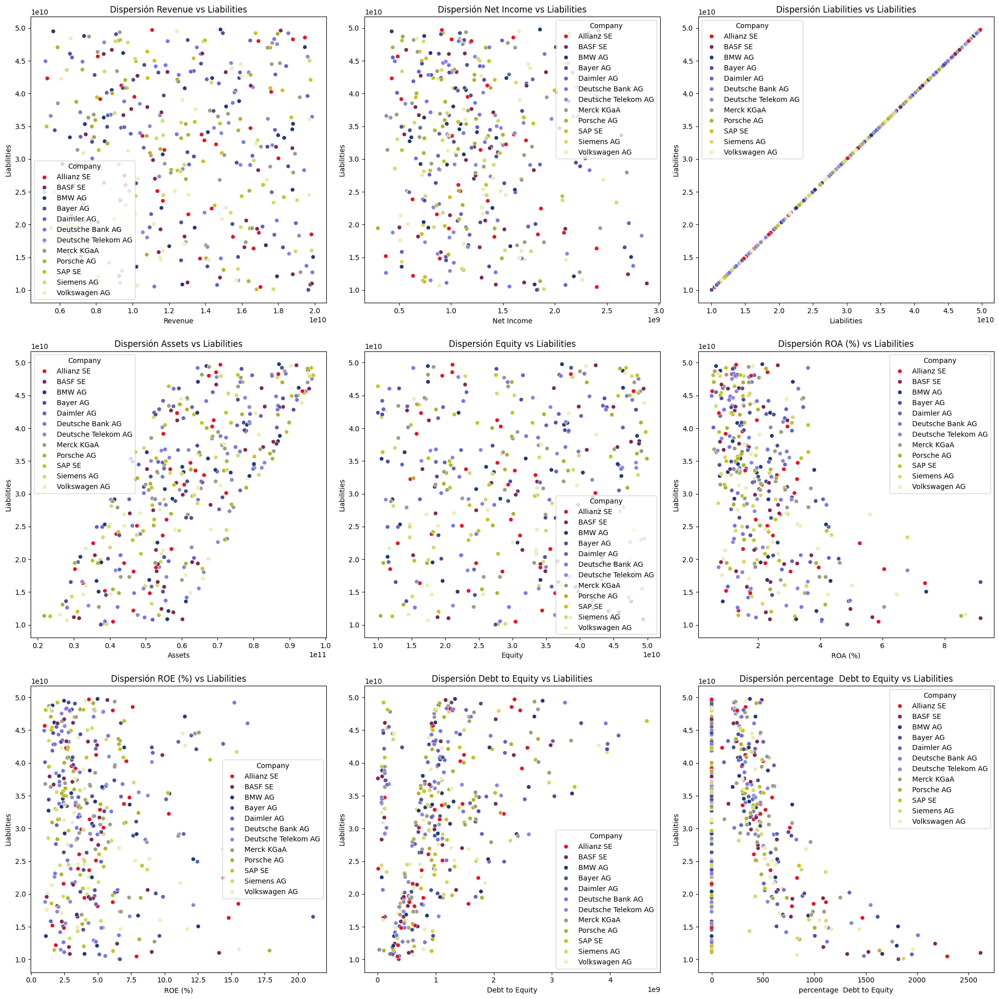

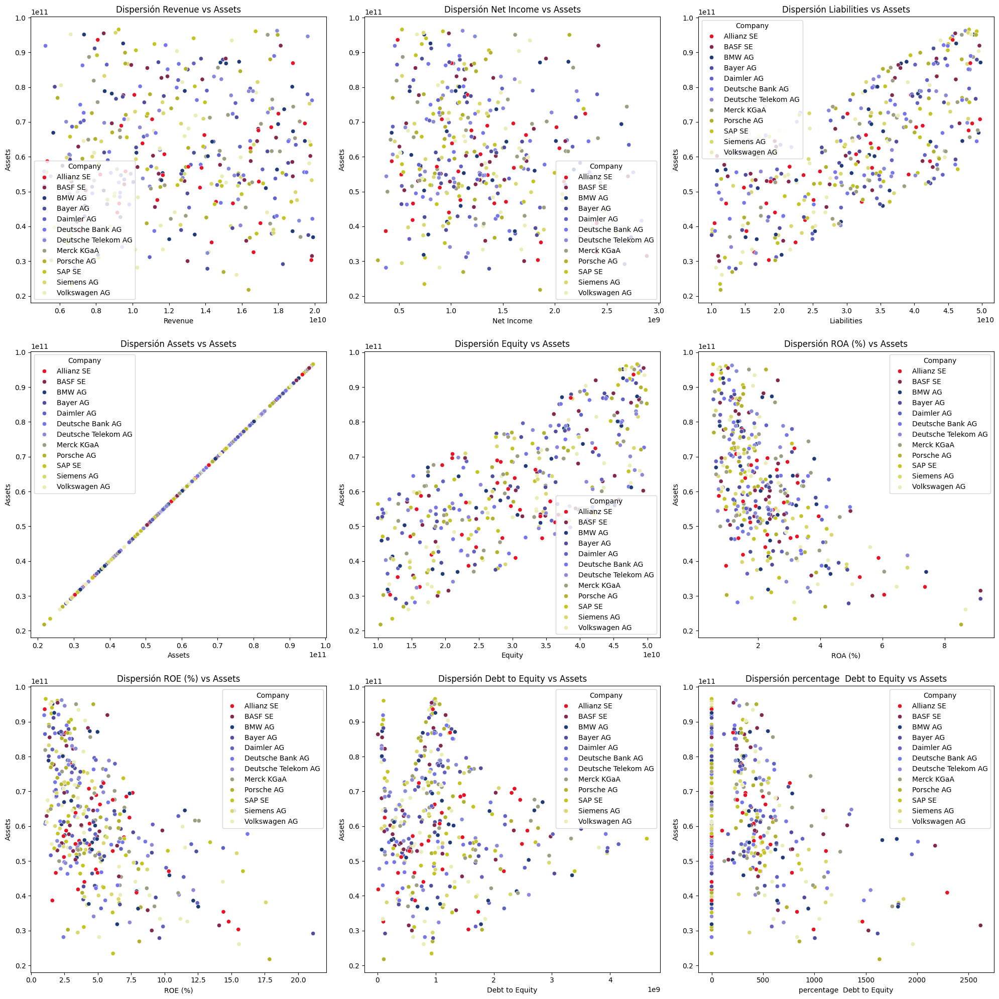

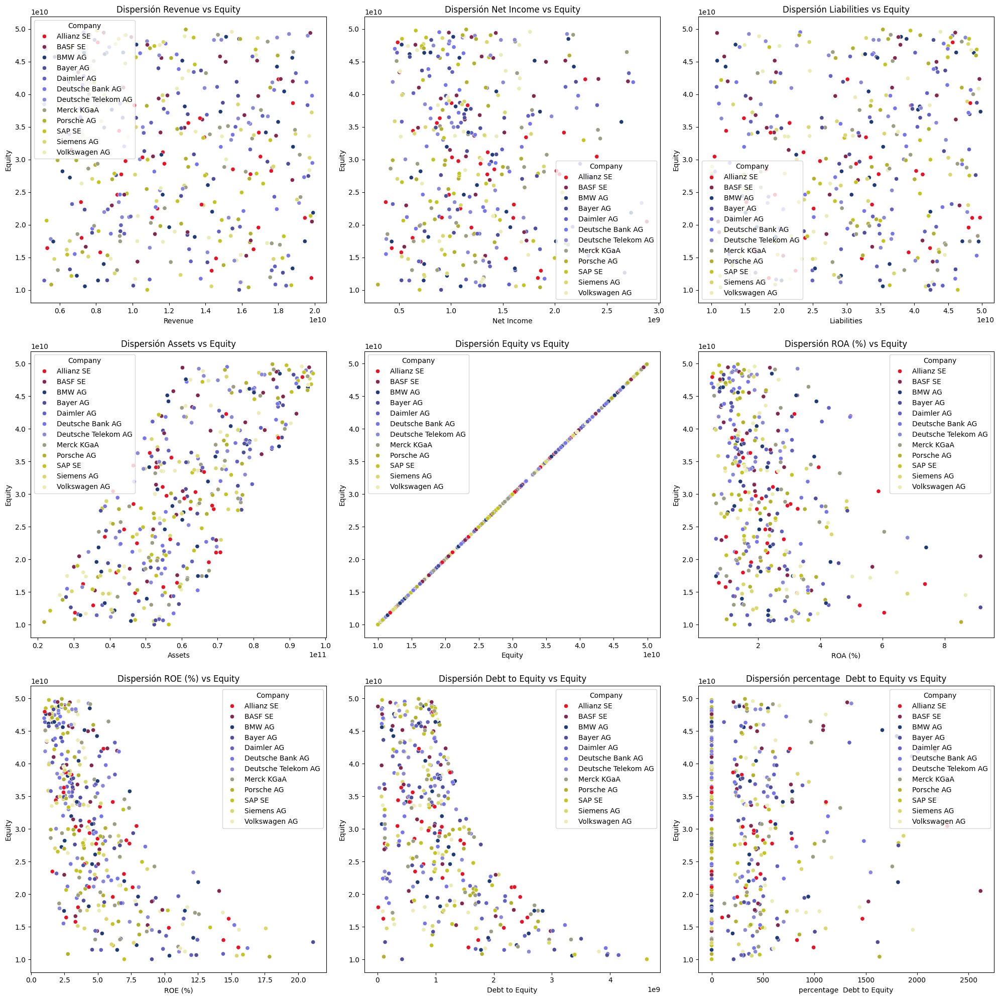

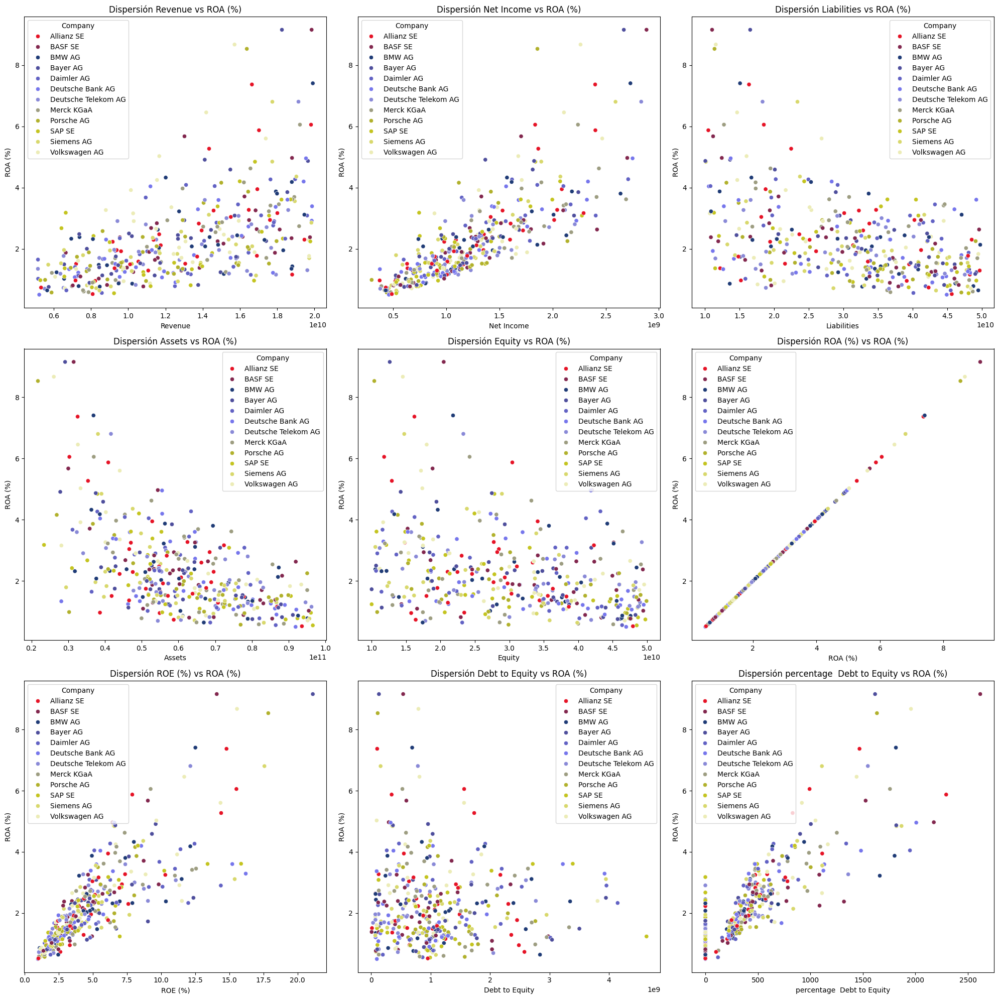

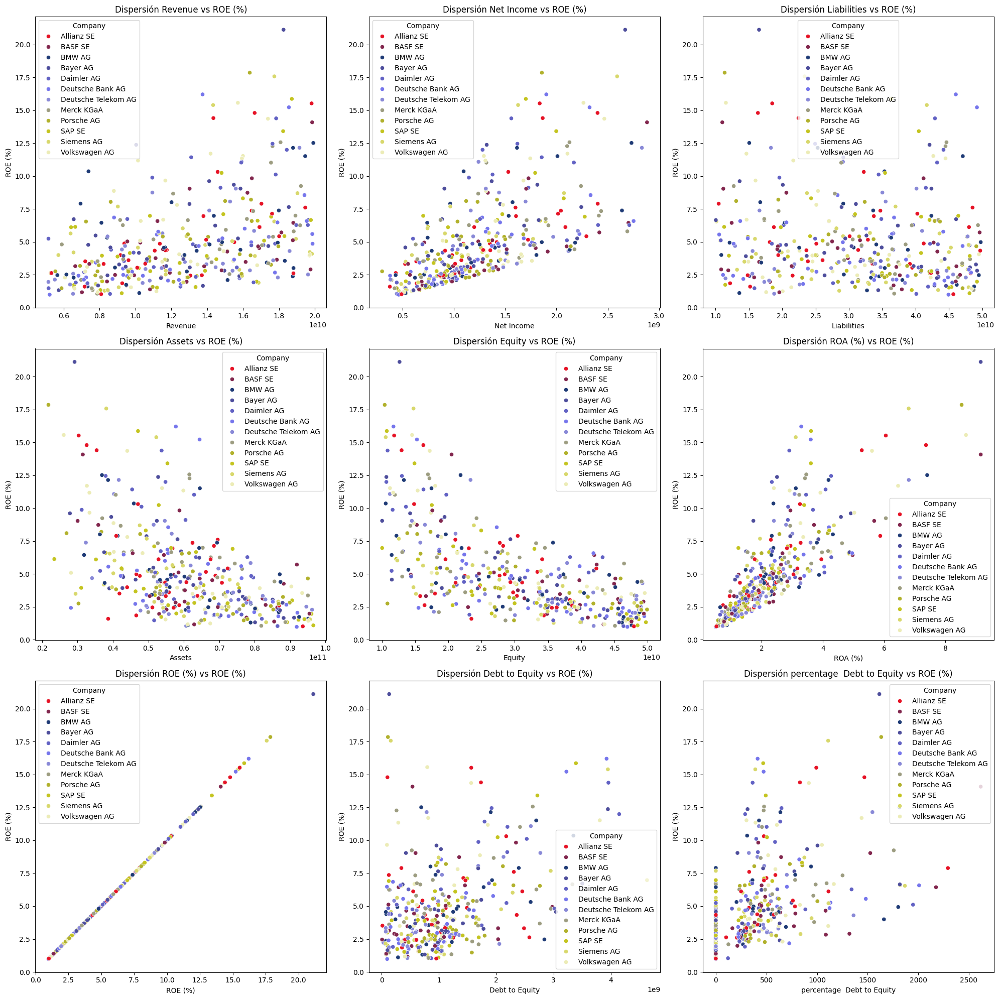

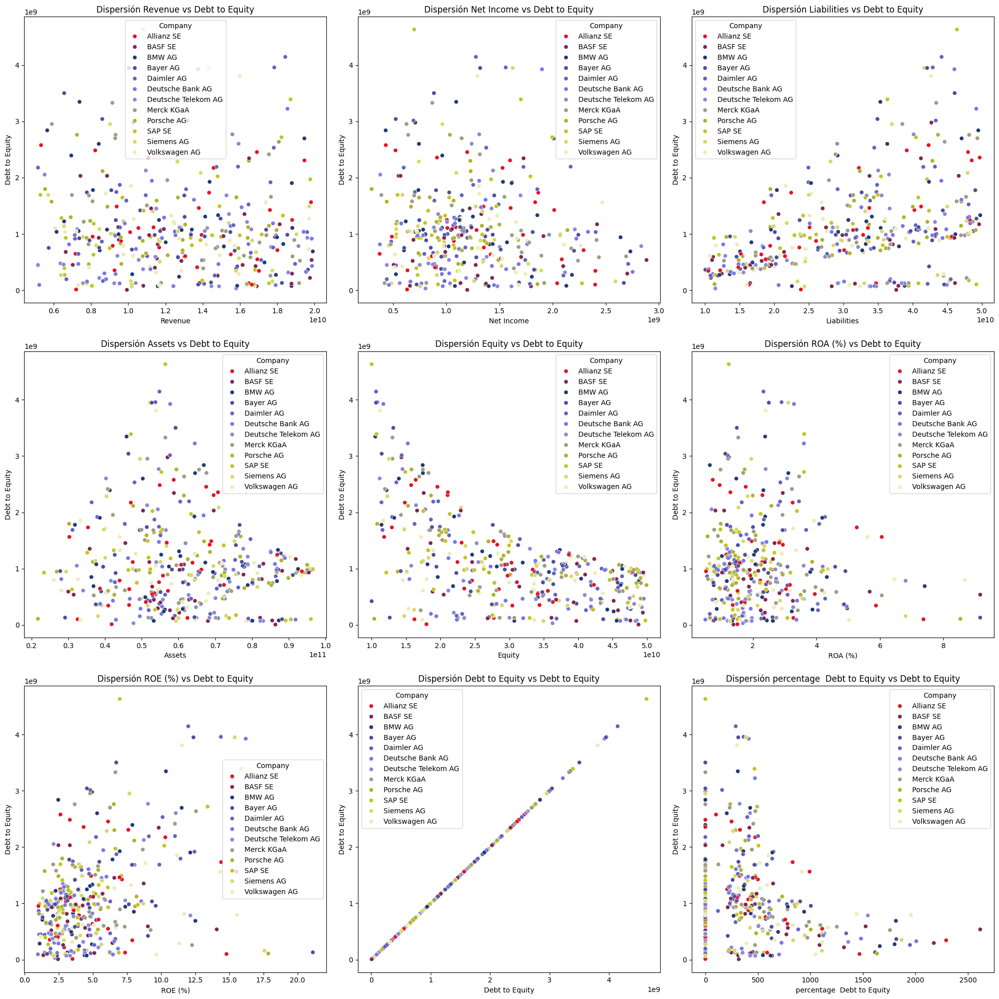

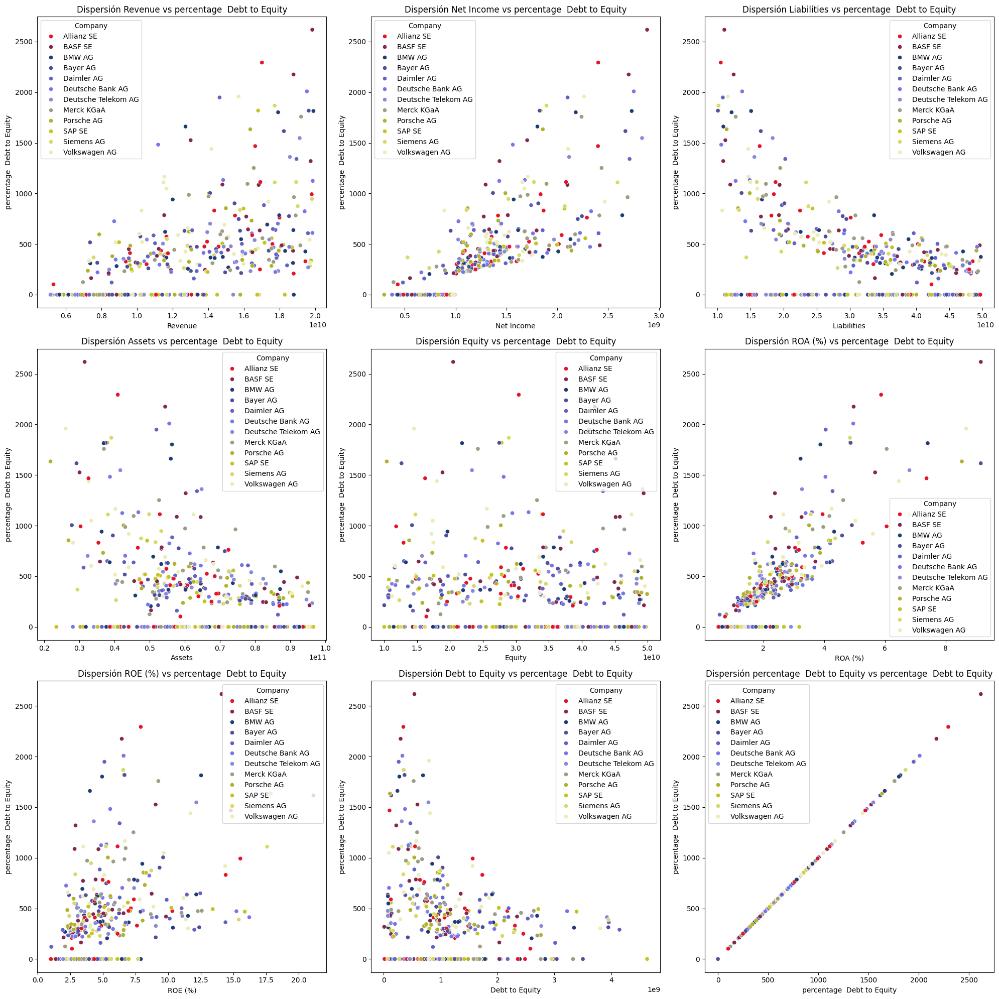

In [131]:
from utils.extra import graph_scaterplot
for i in numeric_columns:
    graph_scaterplot(df, numeric_columns, i, hue="Company", palette=palette, figsize=(20,20))

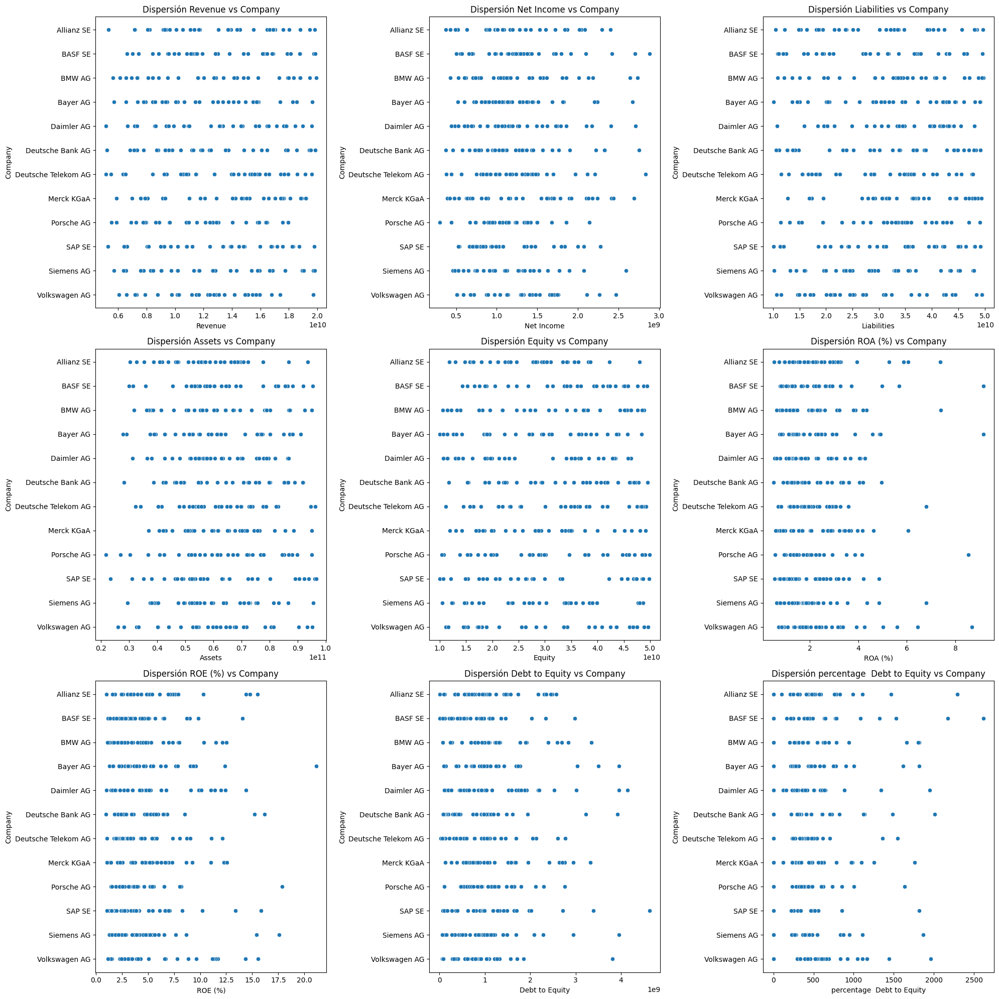

In [133]:
graph_scaterplot(df, numeric_columns, "Company", figsize=(20,20))

### Resumen

Este dataset no posee valores nulos ni duplicados, Pero pudimos observar a través de la inspección que el mismo posee errores en las entradas de ROA, ROE, debt to equity y percentage debt to equity
Para corregirlos tuvimos que volver a generar las entradas en las columnas ROA y ROE.
Para las otras columnas eliminamos los caracteres no numéricos 